# Part 2: Generalization across subjects

In [29]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Data pre-processing
from scipy.io import loadmat
from scipy.ndimage import convolve1d

# Machine Learning
from sklearn.svm import SVC 
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, f1_score
from sklearn.feature_selection import mutual_info_classif, SelectKBest
from sklearn.model_selection import train_test_split, cross_validate, GridSearchCV

# Other
import random


## Task 1: Preprocessing

### Set features

In [ ]:
# Mean absolute value (MAV)
mav = lambda x: np.mean(np.abs(x), axis=0)
# Standard Deviation (STD)
std = lambda x: np.std(x, axis = 0)
# Maximum absolute Value (MaxAV)
maxav = lambda x: np.max(x, axis=0)
# Root mean square (RMS)
rms = lambda x: np.sqrt(np.mean(x**2, axis=0))
# Waveform length (WL)
wl = lambda x: np.sum(np.abs(np.diff(x, axis=0)), axis=0)
# Slope sign changes (SSC)
ssc = lambda x: np.sum(np.diff(np.sign(np.diff(x, axis=0)), axis=0) != 0, axis=0)
# Variance
var = lambda x: np.var(x, axis=0)

### Build dataset function

In [ ]:
def build_dataset_from_ninapro(emg, stimulus, repetition, features=None):
    # Calculate the number of unique stimuli and repetitions, subtracting 1 to exclude the resting condition
    n_stimuli = np.unique(stimulus).size - 1
    n_repetitions = np.unique(repetition).size - 1
    # Total number of samples is the product of stimuli and repetitions
    n_samples = n_stimuli * n_repetitions
    
    # Number of channels in the EMG data
    n_channels = emg.shape[1]
    # Calculate the total number of features by summing the number of channels for each feature
    n_features = sum(n_channels for feature in features)
    
    # Initialize the dataset and labels arrays with zeros
    dataset = np.zeros((n_samples, n_features))
    labels = np.zeros(n_samples)
    current_sample_index = 0
    
    # Loop over each stimulus and repetition to extract features
    for i in range(n_stimuli):
        for j in range(n_repetitions):
            # Assign the label for the current sample
            labels[current_sample_index] = i + 1
            # Calculate the current sample index based on stimulus and repetition
            current_sample_index = i * n_repetitions + j
            current_feature_index = 0
            # Select the time steps corresponding to the current stimulus and repetition
            selected_tsteps = np.logical_and(stimulus == i + 1, repetition == j + 1).squeeze()

            # Skip empty trials
            if not np.any(selected_tsteps):
                continue
            
            # Loop over each feature function provided
            for feature in features:
                # Determine the indices in the dataset where the current feature will be stored
                selected_features = np.arange(current_feature_index, current_feature_index + n_channels)
                # Apply the feature function to the selected EMG data and store the result
                dataset[current_sample_index, selected_features] = feature(emg[selected_tsteps, :])
                # Update the feature index for the next feature
                current_feature_index += n_channels

            # Move to the next sample
            current_sample_index += 1
            
    # Return the constructed dataset and corresponding labels
    return dataset, labels


### Function for removing trials
Removes bad trials based on the total variance of the trial.

In [ ]:
def remove_bad_trials(emg_data, stimulus, repetition, threshold = 0.005) :
    """ Removes trials where the signal variance is below a threshold"""

    unique_trials = np.unique(np.column_stack((stimulus, repetition)), axis=0)
    good_trial_indices = []
    bad_trial_indices = []

    for trial_id, trial in enumerate(unique_trials):
        trial_mask = np.logical_and(stimulus == trial[0], repetition == trial[1]).squeeze()
        # print(f"trialmask: {trial_mask}")
        trial_data = emg_data[trial_mask]
        # print(f"emg data shape {emg_data.shape}")
        # print(f"trial_data {trial_data.shape}")

        #Check variance across all channels
        if np.var(trial_data) >= threshold:
            good_trial_indices.append(trial_mask)
        else:
            bad_trial_indices.append((trial[0], trial[1]))
    
    # good_mask = np.isin(np.column_stack((stimulus, repetition)), good_trial_indices, assume_unique=True)
    good_mask = np.any(np.column_stack(good_trial_indices), axis=1)

    clean_emg = emg_data[good_mask.squeeze()]
    clean_stimulus = stimulus[good_mask.squeeze()]
    clean_repetition = repetition[good_mask.squeeze()]

    return clean_emg, clean_stimulus, clean_repetition, bad_trial_indices

### Remove bad trials for all subjects and create a dataset that combines all subjects

In [ ]:
# Process all subjects and combine datasets
data_folder = "data/part_2"
subject_files = [f"{data_folder}/S{i}_A1_E1.mat" for i in range(1, 28)]

# Selecting the features of interest
features_names = ['mav', 'std', 'maxav', 'rms', 'wl', 'ssc', 'var']
features = [mav, std, maxav, rms, wl, ssc, var]

all_datasets = []
all_labels = []
all_subject_ids = []
processed_subjects = [] # List to store datasets for each subject


for subject_id, file_path in enumerate(subject_files, start=1):
    data = loadmat(file_path)
    emg = data["emg"]
    stimulus = data["restimulus"]
    repitition = data["rerepetition"]

    clean_emg, clean_stimulus, clean_repetition, bad_trial_indices = remove_bad_trials(emg, stimulus, repitition, threshold=0.001)
    print(f"Bad trials: {bad_trial_indices}")
    print(f"Emg new shape: {clean_emg.shape}")

    subject_dataset, subject_labels = build_dataset_from_ninapro(clean_emg, clean_stimulus, clean_repetition, features=features)

    print(f"Subject dataset shape: {subject_dataset.shape}")

    # Save processed dataset and labels 
    processed_subjects.append({
        "id": subject_id,
        "dataset": subject_dataset,
        "labels": subject_labels,
        "stimulus": clean_stimulus,
        "repetition": clean_repetition,
    })

    # Append to combined dataset
    all_datasets.append(subject_dataset)
    all_labels.append(subject_labels)
    all_subject_ids.extend([subject_id] * len(subject_labels))

# Combine all subjects into unified arrays
X_all = np.vstack(all_datasets)
y_all = np.hstack(all_labels)
subject_ids = np.array(all_subject_ids)

print(f"Combined dataset shape: {X_all.shape}")
print(f"Labels shape: {y_all.shape}")
print(f"Subject IDs shape: {subject_ids.shape}")
    

Bad trials: [(10, 1), (12, 5), (12, 6), (12, 8)]
Emg new shape: (99248, 10)
Subject dataset shape: (120, 70)
Bad trials: []
Emg new shape: (100686, 10)
Subject dataset shape: (120, 70)
Bad trials: []
Emg new shape: (100720, 10)
Subject dataset shape: (120, 70)
Bad trials: [(12, 4), (12, 5), (12, 6), (12, 7), (12, 9)]
Emg new shape: (98603, 10)
Subject dataset shape: (120, 70)
Bad trials: []
Emg new shape: (100894, 10)
Subject dataset shape: (120, 70)
Bad trials: []
Emg new shape: (101083, 10)
Subject dataset shape: (120, 70)
Bad trials: []
Emg new shape: (100817, 10)
Subject dataset shape: (120, 70)
Bad trials: []
Emg new shape: (100854, 10)
Subject dataset shape: (120, 70)
Bad trials: []
Emg new shape: (100925, 10)
Subject dataset shape: (120, 70)
Bad trials: []
Emg new shape: (100778, 10)
Subject dataset shape: (120, 70)
Bad trials: []
Emg new shape: (100899, 10)
Subject dataset shape: (120, 70)
Bad trials: []
Emg new shape: (100920, 10)
Subject dataset shape: (120, 70)
Bad trials: [

### Plot some trials

Code for plotting a couple of random removed trials and good trials, to validate that the removed ones should indeed be removed.

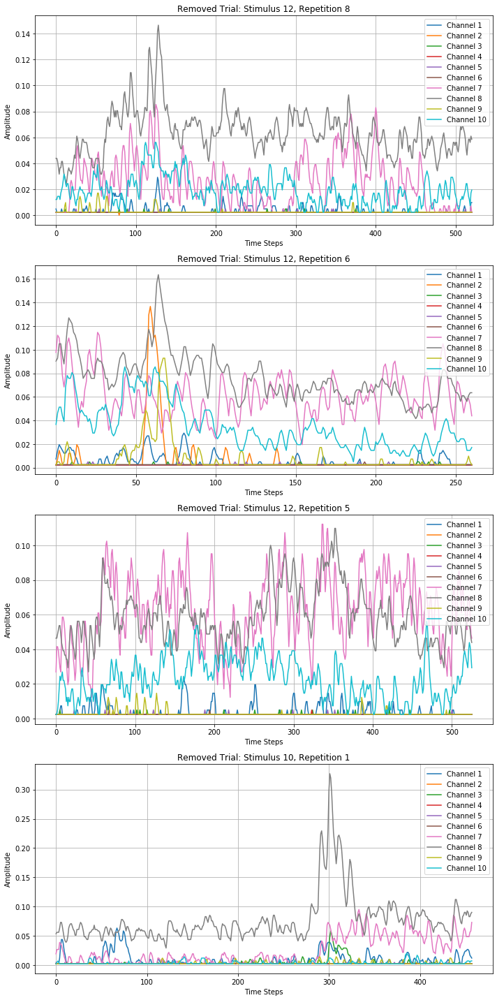

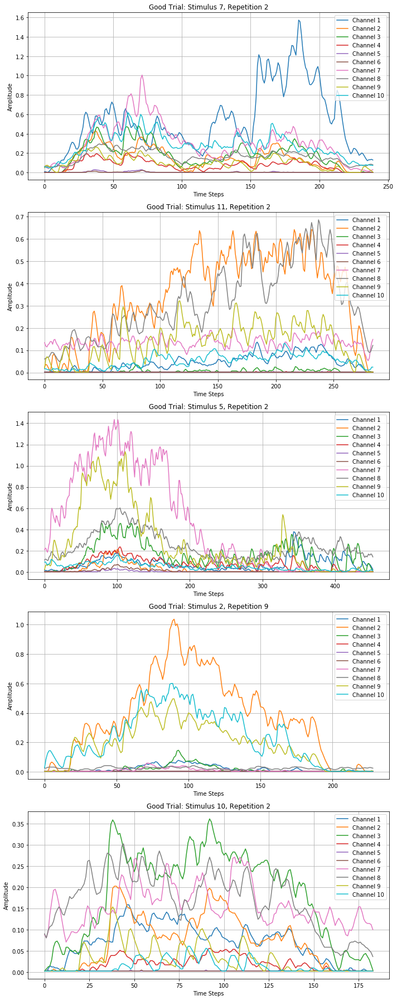

In [33]:
def plot_removed_trials(emg, stimulus, repetition, bad_trials, num_trials=3):
    # Randomly select a few bad trials to plot
    selected_trials = random.sample(bad_trials, min(num_trials, len(bad_trials)))
    
    fig, axs = plt.subplots(len(selected_trials), 1, figsize=(10, 5 * len(selected_trials)))
    if len(selected_trials) == 1:  # Ensure axs is iterable when plotting one trial
        axs = [axs]
    
    for ax, (stimulus_id, repetition_id) in zip(axs, selected_trials):
        # Create trial mask
        trial_mask = np.logical_and(stimulus == stimulus_id, repetition == repetition_id).squeeze()
        trial_emg = emg[trial_mask]

        # Plot each channel's EMG signal
        for channel in range(trial_emg.shape[1]):
            ax.plot(trial_emg[:, channel], label=f"Channel {channel + 1}")

        ax.set_title(f"Removed Trial: Stimulus {stimulus_id}, Repetition {repetition_id}")
        ax.set_xlabel("Time Steps")
        ax.set_ylabel("Amplitude")
        ax.legend(loc="upper right")
        ax.grid()

    plt.tight_layout()
    plt.show()

def plot_good_trials(emg, stimulus, repetition, bad_trials, num_trials=3):
    # Get all trials (stimulus, repetition) pairs
    all_trials = np.unique(np.column_stack((stimulus, repetition)), axis=0)
    good_trials = [trial for trial in all_trials if tuple(trial) not in bad_trials]

    # Randomly select a few good trials to plot
    selected_trials = random.sample(good_trials, min(num_trials, len(good_trials)))

    fig, axs = plt.subplots(len(selected_trials), 1, figsize=(10, 5 * len(selected_trials)))
    if len(selected_trials) == 1:  # Ensure axs is iterable when plotting one trial
        axs = [axs]

    for ax, (stimulus_id, repetition_id) in zip(axs, selected_trials):
        # Create trial mask
        trial_mask = np.logical_and(stimulus == stimulus_id, repetition == repetition_id).squeeze()
        trial_emg = emg[trial_mask]

        # Plot each channel's EMG signal
        for channel in range(trial_emg.shape[1]):
            ax.plot(trial_emg[:, channel], label=f"Channel {channel + 1}")

        ax.set_title(f"Good Trial: Stimulus {stimulus_id}, Repetition {repetition_id}")
        ax.set_xlabel("Time Steps")
        ax.set_ylabel("Amplitude")
        ax.legend(loc="upper right")
        ax.grid()

    plt.tight_layout()
    plt.show()

# Plot removed trials for a specific subject (e.g., subject 1)
subject_id_to_plot = 1
subject_data = loadmat(subject_files[subject_id_to_plot - 1])
emg = subject_data["emg"]
stimulus = subject_data["restimulus"]
repetition = subject_data["rerepetition"]

# Filter bad trials for this subject
_, _, _, bad_trials = remove_bad_trials(emg, stimulus, repetition, threshold=0.001)

# Plot a few of the removed trials
plot_removed_trials(emg, stimulus, repetition, bad_trials, num_trials=5)
plot_good_trials(emg, stimulus, repetition, bad_trials, 5)

After having run this quite a few times it is clear that there is a very large difference in the typical good data and removed data. Looking at the y-axis it is clear that the trials that are being removed are clearly not exibiting a high amplitude of signal and are most likely just due to noise. 

## Task 2: Examining features across subjects


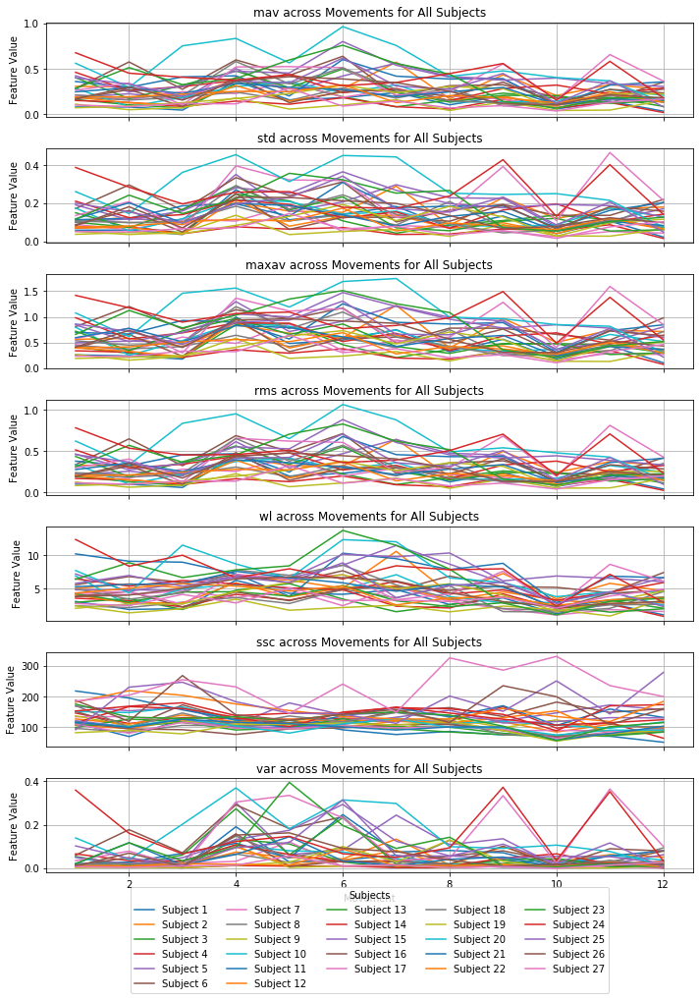

In [35]:
subject_feature_movement = []

for subject_data in processed_subjects:
    # Use the precomputed dataset
    dataset = subject_data["dataset"]
    stimulus = subject_data["stimulus"]
    repetition = subject_data["repetition"]

    # Calculate averages for each stimulus
    n_stimuli = len(np.unique(stimulus)) - 1  # -1 to exclude resting condition
    n_repetitions = len(np.unique(repetition)) - 1  # -1 to exclude non-repetitions
    n_channels = dataset.shape[1] // len(features)  # Channels divided by number of features
    subject_movement_features = []

    for i in range(len(features)):
        feature_stimuli = np.zeros((n_stimuli, n_channels))  # Average features for each stimulus
        feature_idx = i * n_channels + np.arange(n_channels)
        for j in range(n_stimuli):
            idx_repetitions = np.arange(j * n_repetitions, (j + 1) * n_repetitions)
            feature_stimuli[j, :] = np.mean(dataset[idx_repetitions[:, None], feature_idx], axis=0)
        subject_movement_features.append(feature_stimuli)

    subject_feature_movement.append(subject_movement_features)

# Plot features across subjects and movements
x_axis = np.arange(1, n_stimuli + 1)

fig, axs = plt.subplots(len(features), 1, figsize=(10, 15), sharex=True)

for i, feature_name in enumerate(features_names):
    for subject_id, subject_features in enumerate(subject_feature_movement):
        axs[i].plot(
            x_axis,
            np.mean(subject_features[i], axis=1),  # Average across channels
            label=f"Subject {subject_id + 1}"
        )
    axs[i].set_title(f"{feature_name} across Movements for All Subjects")
    axs[i].set_ylabel("Feature Value")
    axs[i].grid()

axs[-1].set_xlabel("Movement")
plt.legend(loc="upper center", bbox_to_anchor=(0.5, -0.1), ncol=5, title="Subjects")
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

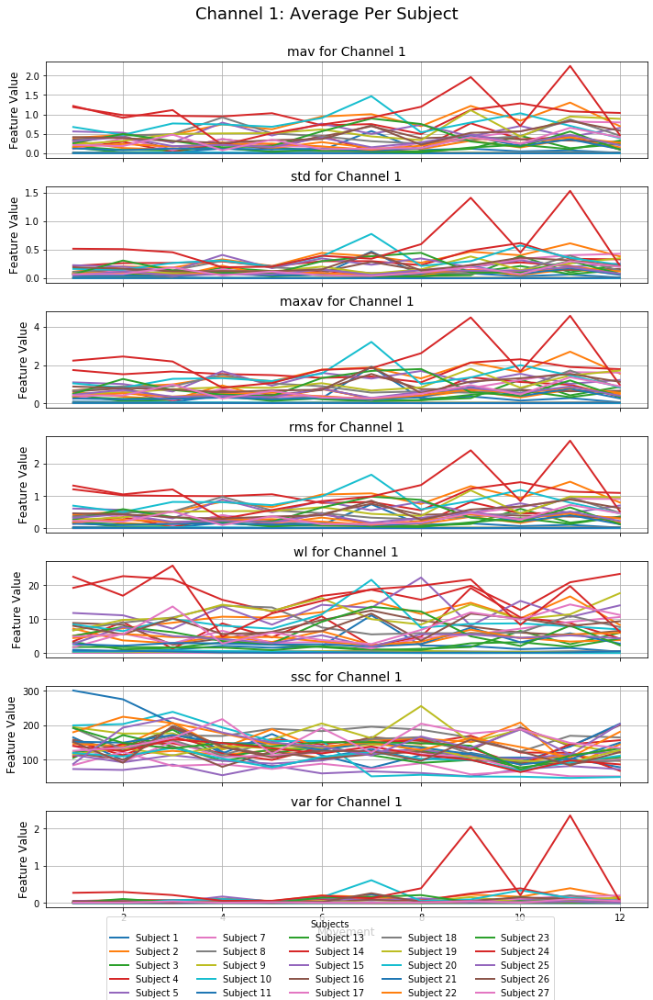

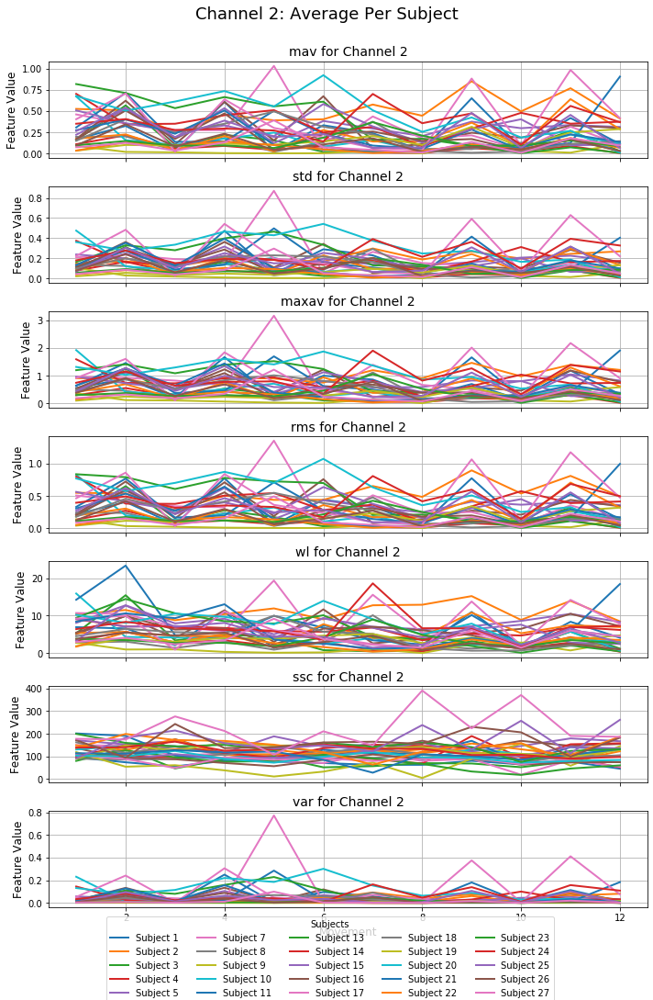

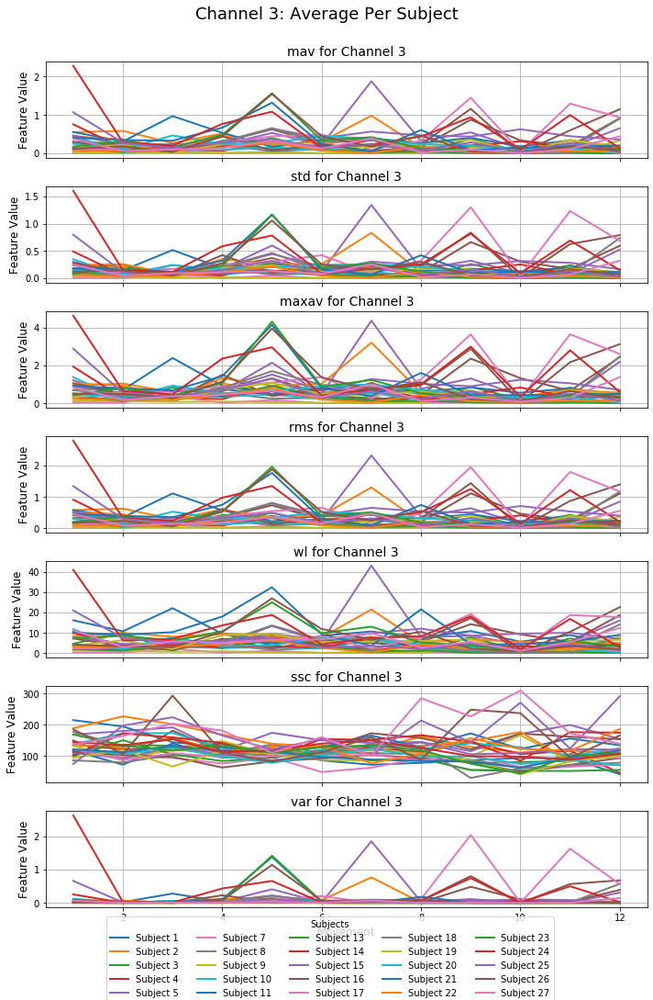

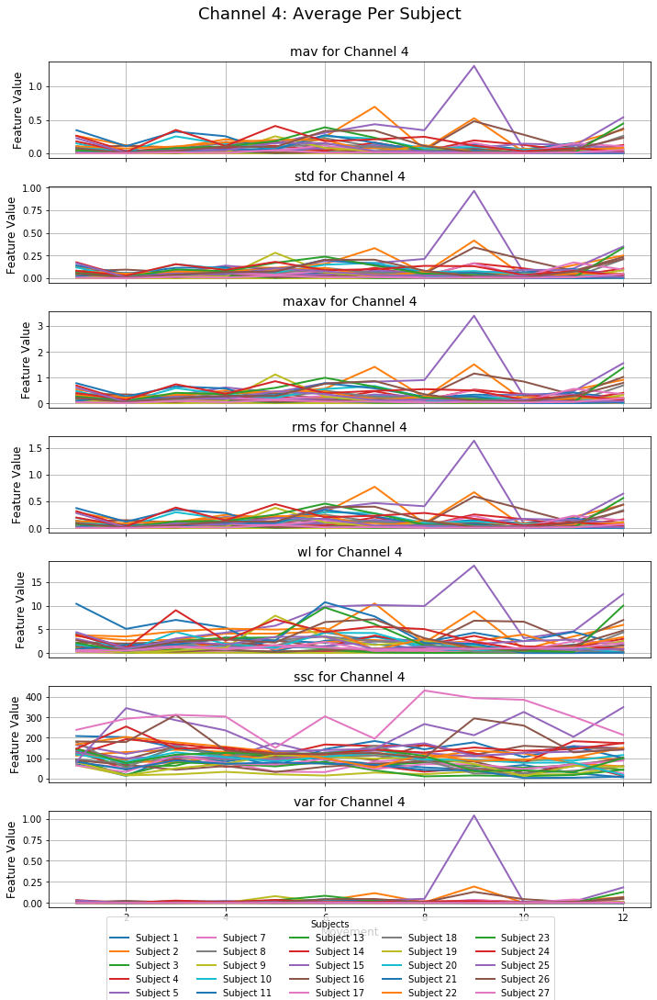

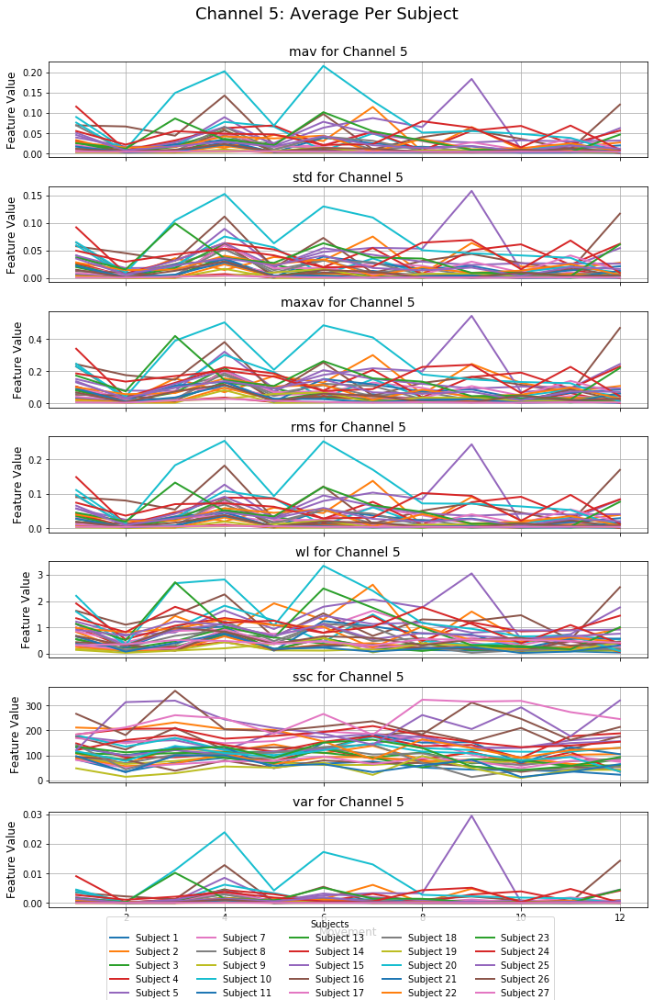

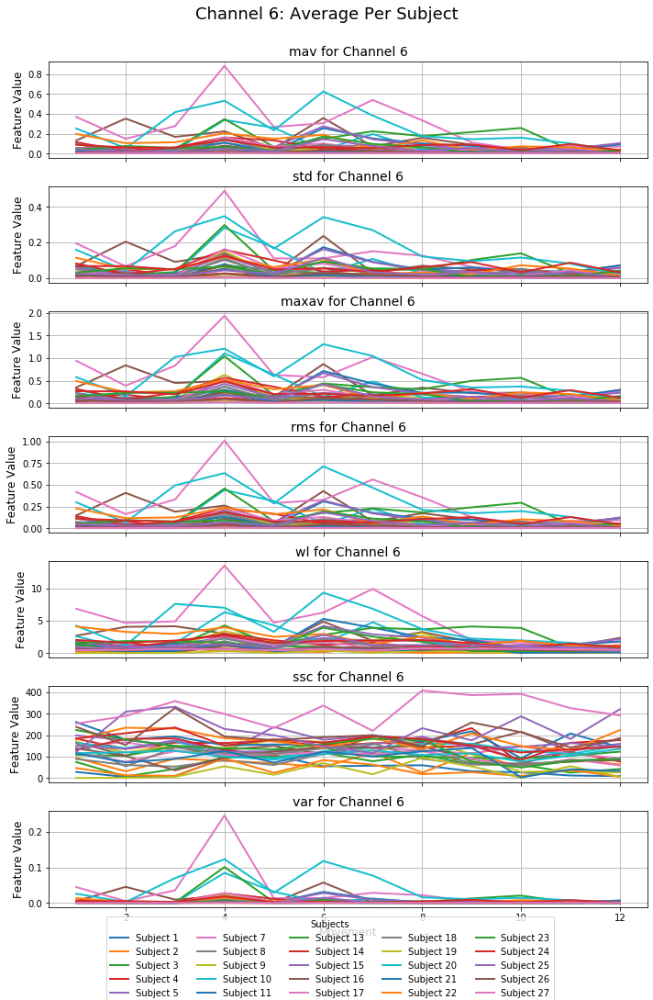

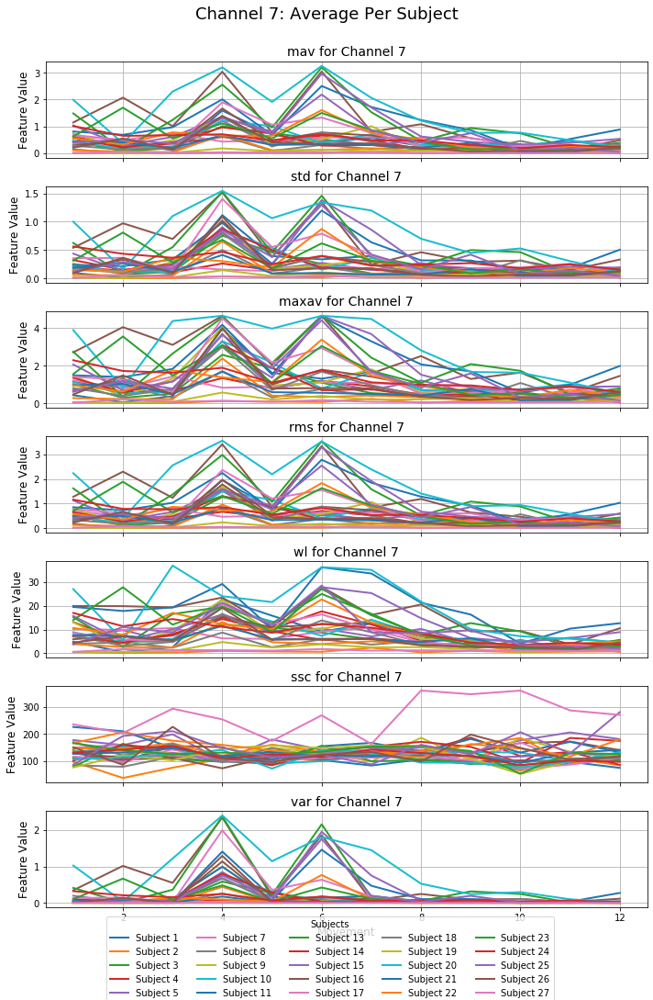

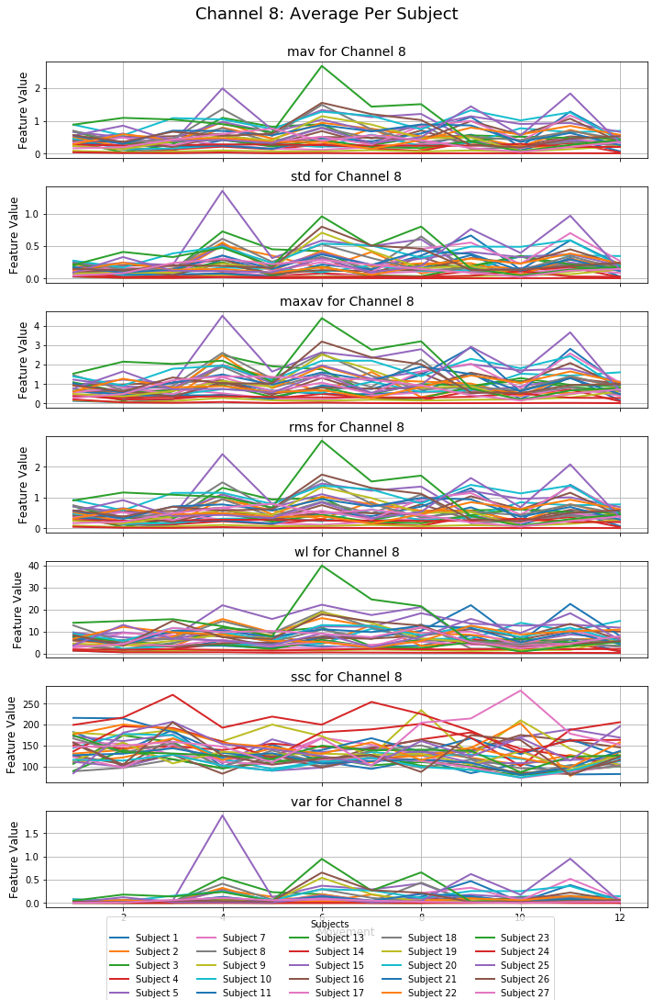

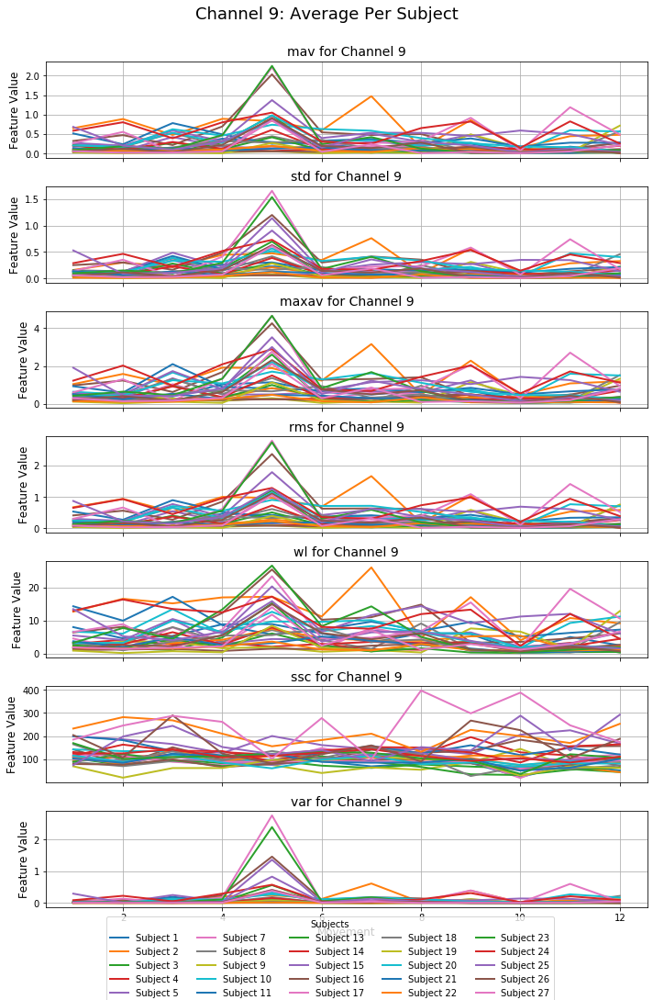

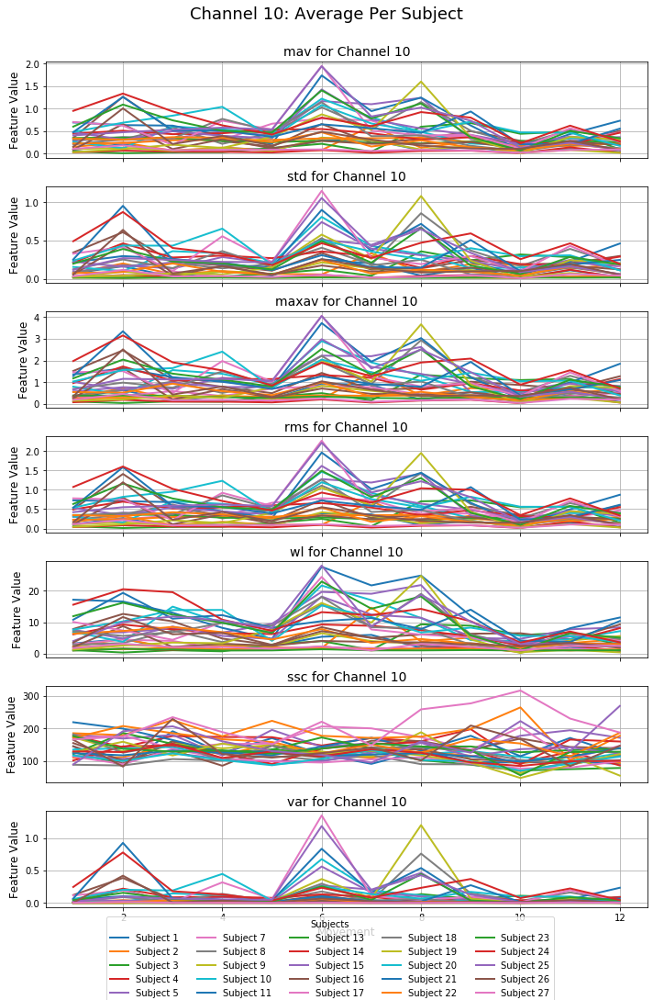

In [50]:
def plot_avg_per_channel_separate_graphs(subject_feature_movement, features_names, n_stimuli, n_channels):
    """
    Plots the average for each channel with separate graphs for each channel,
    and lines representing each subject. Displays the legend only once at the bottom.
    """
    x_axis = np.arange(1, n_stimuli + 1)

    for channel in range(n_channels):
        # Increase figure size for better visibility
        fig, axs = plt.subplots(len(features_names), 1, figsize=(10, 15), sharex=True)
        fig.suptitle(f"Channel {channel + 1}: Average Per Subject", fontsize=18)

        # Collect handles and labels for a single legend
        all_handles = []
        all_labels = []

        for i, feature_name in enumerate(features_names):
            for subject_id, subject_features in enumerate(subject_feature_movement):
                line, = axs[i].plot(
                    x_axis,
                    subject_features[i][:, channel],  # Average for current channel and feature
                    label=f"Subject {subject_id + 1}",
                    linewidth=2  # Slightly thicker lines for better clarity
                )
                # Collect one handle and label per subject
                if i == 0:  # Only collect once for the first subplot
                    all_handles.append(line)
                    all_labels.append(f"Subject {subject_id + 1}")

            axs[i].set_title(f"{feature_name} for Channel {channel + 1}", fontsize=14)
            axs[i].set_ylabel("Feature Value", fontsize=12)
            axs[i].grid()

        axs[-1].set_xlabel("Movement", fontsize=12)

        # Add a single legend at the bottom
        fig.legend(
            all_handles, all_labels,
            loc="lower center",
            bbox_to_anchor=(0.5, -0.02),  # Bring the legend closer to the figure
            ncol=5,
            fontsize="medium",
            title="Subjects"
        )

        plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to fit the legend within the figure
        plt.show()


    # Calculate the number of stimuli and channels from the first subject
n_stimuli = len(np.unique(processed_subjects[0]["stimulus"])) - 1  # -1 to exclude resting condition
n_channels = processed_subjects[0]["dataset"].shape[1] // len(features)  # Channels divided by number of features

# Call the function
plot_avg_per_channel_separate_graphs(subject_feature_movement, features_names, n_stimuli, n_channels)



## Task 3: Training Classifier

### Splitting into train and test
Since the dataset is highly unbalanced a special sort of splitting of the data or training of the model is necessary. First of all it is important to startify the splitting, meaning that the train and test splits have similar class distributions. Then there are other possible measures such as using a stratifiedKFold for Cross-Validation, this ensures that each fold has a similar class distribution, which allows us to evalueate model on multiple train-test splits, which would bake it robust to bias from a single split. This could then be combined with oversampling the minority classes (Synthetic Minority Oversampling Technique). This generates synthetic samples for the minority class in the training data. Another option instead of SMOT would be to adjust the model's loss function to penalize misclassifications of the minority class more heavily. This is very simple when using SVM so here we are implementing StratifiedKFold cross-validation and balancing class weights.

In [ ]:
# Splitting into Training (75%) and Testing Set (25%)
X_train, X_test, y_train, y_test = train_test_split(X_all, y_all, test_size=0.25, stratify = y_all)

# Standardizing data w.r.t to X_train
scaler = StandardScaler()
X_train_z = scaler.fit_transform(X_train)  # Fit the scaler on the training data and transform it
X_test_z = scaler.transform(X_test)   
print(f"Shapes =  X_train: {X_train_z.shape} | X_test: {X_test_z.shape}")

Shapes =  X_train: (2430, 70) | X_test: (810, 70)


In [ ]:
def plot_avg_per_channel_separate_graphs(subject_feature_movement, features_names, n_stimuli, n_channels):
    """
    Plots the average for each channel with separate graphs for each channel,
    and lines representing each subject.
    """
    x_axis = np.arange(1, n_stimuli + 1)

    for channel in range(n_channels):
        fig, axs = plt.subplots(len(features_names), 1, figsize=(12, 4 * len(features_names)), sharex=True)
        fig.suptitle(f"Channel {channel + 1}: Average Per Subject", fontsize=16)

        for i, feature_name in enumerate(features_names):
            for subject_id, subject_features in enumerate(subject_feature_movement):
                axs[i].plot(
                    x_axis,
                    subject_features[i][:, channel],  # Average for current channel and feature
                    label=f"Subject {subject_id + 1}"
                )
            axs[i].set_title(f"{feature_name} for Channel {channel + 1}")
            axs[i].set_ylabel("Feature Value")
            axs[i].grid()
            axs[i].legend(loc="upper right", title="Subjects")

        axs[-1].set_xlabel("Movement")
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()

# Calculate the number of stimuli and channels from the first subject
n_stimuli = len(np.unique(processed_subjects[0]["stimulus"])) - 1  # -1 to exclude resting condition
n_channels = processed_subjects[0]["dataset"].shape[1] // len(features)  # Channels divided by number of features

# Call the function
plot_avg_per_channel_separate_graphs(subject_feature_movement, features_names, n_stimuli, n_channels)


## ------------------------------------------------------Legacy----------------------------------------------------------------


In [19]:
# Process all subjects and combine datasets
data_folder = "data/part_2"
subject_files = [f"{data_folder}/S{i}_A1_E1.mat" for i in range(1, 28)]

# Selecting the features of interest
features_names = ['mav', 'std', 'maxav', 'rms', 'wl', 'ssc', 'var']
features = [mav, std, maxav, rms, wl, ssc, var]

all_datasets = []
all_labels = []
all_subject_ids = []

for subject_id, file_path in enumerate(subject_files, start=1):
    data = loadmat(file_path)
    emg = data["emg"]
    stimulus = data["restimulus"]
    repitition = data["rerepetition"]

    subject_dataset, subject_labels = build_dataset_from_ninapro(emg, stimulus, repitition, features=features)

    print(f"Subject dataset shape: {subject_dataset.shape}")


    # Append to combined dataset
    all_datasets.append(subject_dataset)
    all_labels.append(subject_labels)
    all_subject_ids.extend([subject_id] * len(subject_labels))

# Combine all subjects into unified arrays
X_all = np.vstack(all_datasets)
y_all = np.hstack(all_labels)
subject_ids = np.array(all_subject_ids)

print(f"Combined dataset shape: {X_all.shape}")
print(f"Labels shape: {y_all.shape}")
print(f"Subject IDs shape: {subject_ids.shape}")

Subject dataset shape: (120, 70)
Subject dataset shape: (120, 70)
Subject dataset shape: (120, 70)
Subject dataset shape: (120, 70)
Subject dataset shape: (120, 70)
Subject dataset shape: (120, 70)
Subject dataset shape: (120, 70)
Subject dataset shape: (120, 70)
Subject dataset shape: (120, 70)
Subject dataset shape: (120, 70)
Subject dataset shape: (120, 70)
Subject dataset shape: (120, 70)
Subject dataset shape: (120, 70)
Subject dataset shape: (120, 70)
Subject dataset shape: (120, 70)
Subject dataset shape: (120, 70)
Subject dataset shape: (120, 70)
Subject dataset shape: (120, 70)
Subject dataset shape: (120, 70)
Subject dataset shape: (120, 70)
Subject dataset shape: (120, 70)
Subject dataset shape: (120, 70)
Subject dataset shape: (120, 70)
Subject dataset shape: (120, 70)
Subject dataset shape: (120, 70)
Subject dataset shape: (120, 70)
Subject dataset shape: (120, 70)
Combined dataset shape: (3240, 70)
Labels shape: (3240,)
Subject IDs shape: (3240,)


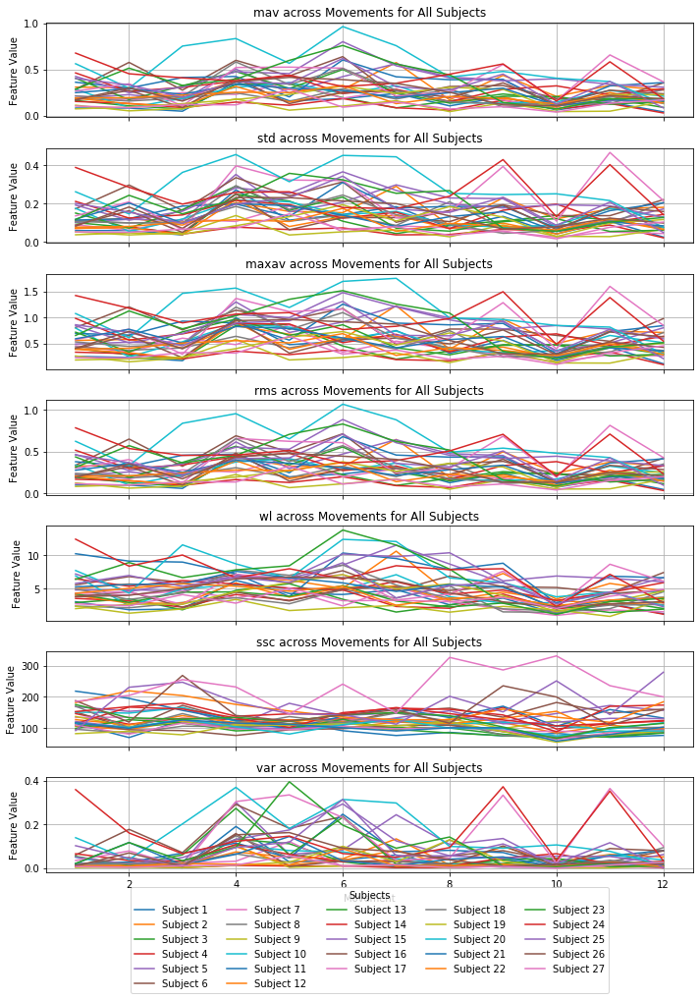

In [25]:
subject_feature_movement = []

for subject_id, file_path in enumerate(subject_files, start=1):
    data = loadmat(file_path)
    emg = data["emg"]
    stimulus = data["restimulus"]
    repetition = data["rerepetition"]

    # Build dataset
    dataset, _ = build_dataset_from_ninapro(emg, stimulus, repetition, features=features)

    # Calculate averages for each stimulus
    # -1 because 0 is the resting condition
    n_stimuli = len(np.unique(stimulus)) - 1 
    # -1 because 0 is not a repetition
    n_repetitions = len(np.unique(repetition)) - 1 
    n_channels = emg.shape[1]
    subject_movement_features = []

    for i in range(len(features)):
        feature_stimuli = np.zeros((n_stimuli, n_channels))  # Average features for each stimulus
        feature_idx = i * n_channels + np.arange(n_channels)
        for j in range(n_stimuli):
            idx_repetitions = np.arange(j * n_repetitions, (j + 1) * n_repetitions)
            feature_stimuli[j, :] = np.mean(dataset[idx_repetitions[:, None], feature_idx], axis=0)
        subject_movement_features.append(feature_stimuli)

    subject_feature_movement.append(subject_movement_features)

# Plot features across subjects and movements
x_axis = np.arange(1, n_stimuli + 1)

fig, axs = plt.subplots(len(features), 1, figsize=(10, 15), sharex=True)

for i, feature_name in enumerate(features_names):
    for subject_id, subject_features in enumerate(subject_feature_movement):
        axs[i].plot(
            x_axis,
            np.mean(subject_features[i], axis=1),  # Average across channels
            label=f"Subject {subject_id + 1}"
        )
    axs[i].set_title(f"{feature_name} across Movements for All Subjects")
    axs[i].set_ylabel("Feature Value")
    axs[i].grid()

axs[-1].set_xlabel("Movement")
plt.legend(loc="upper center", bbox_to_anchor=(0.5, -0.1), ncol=5, title="Subjects")
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

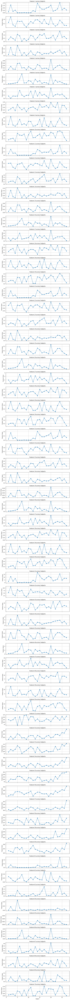

Feature 1 - Mean: 0.3200, Std: 0.2950
Feature 2 - Mean: 0.2399, Std: 0.1214
Feature 3 - Mean: 0.2592, Std: 0.1462
Feature 4 - Mean: 0.0838, Std: 0.0704
Feature 5 - Mean: 0.0241, Std: 0.0203
Feature 6 - Mean: 0.0658, Std: 0.0701
Feature 7 - Mean: 0.5262, Std: 0.3666
Feature 8 - Mean: 0.4829, Std: 0.2283
Feature 9 - Mean: 0.2548, Std: 0.1747
Feature 10 - Mean: 0.3972, Std: 0.1920
Feature 11 - Mean: 0.1417, Std: 0.1307
Feature 12 - Mean: 0.1485, Std: 0.0663
Feature 13 - Mean: 0.1800, Std: 0.1072
Feature 14 - Mean: 0.0615, Std: 0.0456
Feature 15 - Mean: 0.0217, Std: 0.0166
Feature 16 - Mean: 0.0445, Std: 0.0387
Feature 17 - Mean: 0.2719, Std: 0.1737
Feature 18 - Mean: 0.2080, Std: 0.0986
Feature 19 - Mean: 0.1732, Std: 0.1050
Feature 20 - Mean: 0.1998, Std: 0.1156
Feature 21 - Mean: 0.6516, Std: 0.5670
Feature 22 - Mean: 0.6002, Std: 0.2563
Feature 23 - Mean: 0.6978, Std: 0.3847
Feature 24 - Mean: 0.2497, Std: 0.1819
Feature 25 - Mean: 0.0865, Std: 0.0595
Feature 26 - Mean: 0.1840, Std: 0.

In [26]:
all_subject_features = []  # List to store features per subject

for subject_id, file_path in enumerate(subject_files, start=1):
    data = loadmat(file_path)
    emg = data["emg"]
    stimulus = data["restimulus"]
    repetition = data["rerepetition"]

    # Extract features for this subject
    subject_dataset, _ = build_dataset_from_ninapro(emg, stimulus, repetition, features=features)
    # Average features across all samples for each subject
    subject_avg_features = np.mean(subject_dataset, axis=0)
    all_subject_features.append(subject_avg_features)

# Convert to numpy array for easier manipulation
all_subject_features = np.array(all_subject_features)

# Plot the features across subjects
num_features = all_subject_features.shape[1]
x_axis = np.arange(1, all_subject_features.shape[0] + 1)

fig, axs = plt.subplots(num_features, 1, figsize=(10, 2 * num_features), sharex=True)
for i in range(num_features):
    axs[i].plot(x_axis, all_subject_features[:, i], marker="o")
    axs[i].set_title(f"Feature {i + 1} across Subjects")
    axs[i].set_ylabel("Feature Value")
    axs[i].grid()

plt.xlabel("Subject")
plt.tight_layout()
plt.show()

# Print summary statistics for comparison
for i in range(num_features):
    print(f"Feature {i + 1} - Mean: {np.mean(all_subject_features[:, i]):.4f}, "
          f"Std: {np.std(all_subject_features[:, i]):.4f}")

In [22]:
# Splitting into Training (75%) and Testing Set (25%)
X_train, X_test, y_train, y_test = train_test_split(X_all, y_all, test_size=0.25, stratify = y_all)

# Standardizing data w.r.t to X_train
scaler = StandardScaler()
X_train_z = scaler.fit_transform(X_train)  # Fit the scaler on the training data and transform it
X_test_z = scaler.transform(X_test)   
print(f"Shapes =  X_train: {X_train_z.shape} | X_test: {X_test_z.shape}")

Shapes =  X_train: (2430, 70) | X_test: (810, 70)


In [ ]:
def remove_inactive_channels(emg_data, threshold=0.01):
    channel_variances = np.var(emg_data, axis=0)
    inactive_channels = np.where(channel_variances < threshold)[0]
    clean_emg = np.delete(emg_data, inactive_channels, axis=1)
    return clean_emg, inactive_channels

In [ ]:
#Load and proprocess all subjects
all_data = []
all_labels = []
all_subject_ids = []

for subject_id, file in enumerate(subject_files, start=1):
    emg, stimulus, repetition = getSmoothedEmgWindows(file, 25)

    clean_emg, inactive_channels = remove_inactive_channels(emg, 0.005)

    print(f"Inactive channels removed: {inactive_channels}")
    print(f"New EMG shape: {clean_emg.shape}")

#

Inactive channels removed: [3 4 5]
New EMG shape: (101014, 7)
Inactive channels removed: [4 5 6]
New EMG shape: (100686, 7)
Inactive channels removed: [3 4 5]
New EMG shape: (100720, 7)
Inactive channels removed: [3 4 5 9]
New EMG shape: (100835, 6)
Inactive channels removed: [0 4 5]
New EMG shape: (100894, 7)
Inactive channels removed: [0 4]
New EMG shape: (101083, 8)
Inactive channels removed: [0 2 3 4]
New EMG shape: (100817, 6)
Inactive channels removed: [0 4 5]
New EMG shape: (100854, 7)
Inactive channels removed: [0 1 3 4 5 7]
New EMG shape: (100925, 4)
Inactive channels removed: [0 3 4]
New EMG shape: (100778, 7)
Inactive channels removed: [0 4]
New EMG shape: (100899, 8)
Inactive channels removed: [3 4 5 9]
New EMG shape: (100920, 6)
Inactive channels removed: [3 4 9]
New EMG shape: (100948, 7)
Inactive channels removed: [4 5 7]
New EMG shape: (100785, 7)
Inactive channels removed: [3 4]
New EMG shape: (101508, 8)
Inactive channels removed: [3 4 5]
New EMG shape: (101191, 7)
In

In [ ]:
data_folder = "data/part_2"
subject_files = [f"{data_folder}/S{i}_A1_E1.mat" for i in range(1, 28)]

def getSmoothedEmgWindows(file_path, mov_mean_length):
    data = loadmat(file_path)   
    emg_rectified = data["emg"].copy()
    stimulus = data["restimulus"] 
    repetition = data["rerepetition"] 

    # -1 because 0 is the resting condition
    n_stimuli = len(np.unique(stimulus)) - 1 
    # -1 because 0 is not a repetition
    n_repetitions = len(np.unique(repetition)) - 1 
    n_channels = emg_rectified.shape[1]

    # Apply moving average filter (smoothing)
    mov_mean_weights = np.ones(mov_mean_length) / mov_mean_length

    #initializing the data structure    
    emg_windows = [[None for repetition_idx in range(n_repetitions)] for stimuli_idx in range(n_stimuli)]
    emg_envelopes = [[None for repetition_idx in range(n_repetitions)] for stimuli_idx in range(n_stimuli)]

    for stimuli_idx in range(n_stimuli):
        for repetition_idx in range(n_repetitions):
            idx = np.logical_and(stimulus == stimuli_idx + 1, repetition == repetition_idx + 1).flatten()
            emg_windows[stimuli_idx][repetition_idx] = emg_rectified[idx, :]
            emg_envelopes[stimuli_idx][repetition_idx] = convolve1d(emg_windows[stimuli_idx][repetition_idx], mov_mean_weights, axis=0) 

    return  emg_rectified, stimulus, repetition


c:\Users\katla\anaconda3\lib\site-packages\ipykernel_launcher.py:21: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations


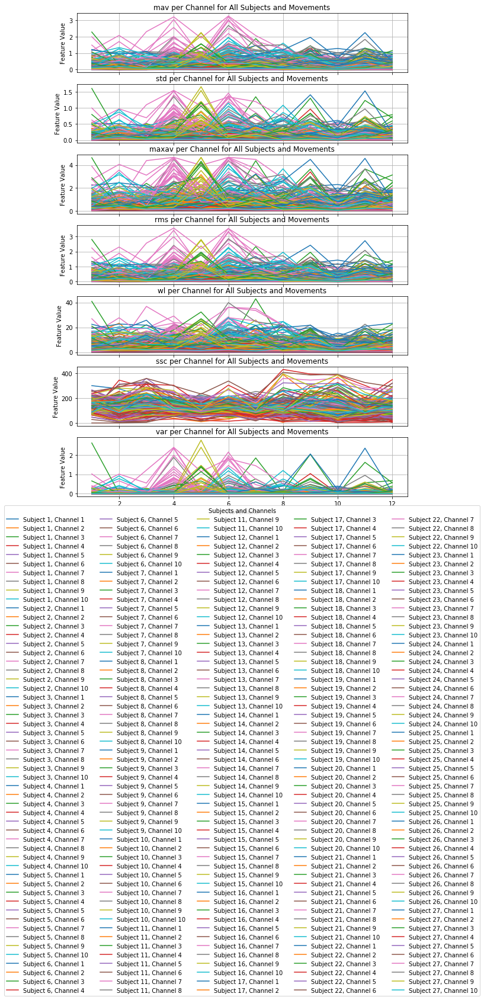

In [ ]:
def plot_avg_per_channel(subject_feature_movement, features_names, n_stimuli, n_channels):
    x_axis = np.arange(1, n_stimuli + 1)

    fig, axs = plt.subplots(len(features_names), 1, figsize=(10, 15), sharex=True)

    for i, feature_name in enumerate(features_names):
        for subject_id, subject_features in enumerate(subject_feature_movement):
            # Extract per-channel averages for the current feature
            for channel in range(n_channels):
                axs[i].plot(
                    x_axis,
                    subject_features[i][:, channel],  # Average per channel
                    label=f"Subject {subject_id + 1}, Channel {channel + 1}"
                )
        axs[i].set_title(f"{feature_name} per Channel for All Subjects and Movements")
        axs[i].set_ylabel("Feature Value")
        axs[i].grid()

    axs[-1].set_xlabel("Movement")
    plt.legend(loc="upper center", bbox_to_anchor=(0.5, -0.1), ncol=5, title="Subjects and Channels")
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Calculate the number of stimuli and channels from the first subject
n_stimuli = len(np.unique(processed_subjects[0]["stimulus"])) - 1  # -1 to exclude resting condition
n_channels = processed_subjects[0]["dataset"].shape[1] // len(features)  # Channels divided by number of features

# Call the function
plot_avg_per_channel(subject_feature_movement, features_names, n_stimuli, n_channels)